# Distance measurement between a line and the center of gravity of the part 

This code has been built for measuring the distance between a line and the center of gravity of a part. To do so, we need to write the coordinates of the center of gravity, and using a similar approach as the one we used for measuring the center of gravity, to build the transformation from the image coordinates to world coordinates. Then we will have to point on the image two points of the axes of oscillation of the part.

#### Libraries

In [1]:
import cv2 # pip install opencv-python
import numpy as np # conda install numpy
import pyzbar.pyzbar as pyzbar # pip install git ; pip install git+https://github.com/sushil-bharati/pyzbar.git
# Then you must add .dll files in the anaconda library folder
from scipy.optimize import minimize_scalar # conda install scipy

## Definition of the variables specific to the part

The wheel radius, $R\_wheel$ are measured at a gicen pressure, with a person of whom we know the weight on the bike, and on a flat surface.

The $wheelbase$ of the bike is the distance between the 2 contact points of the wheel with the ground. It is measured with a tape measure.

Careful, $real\_angle$ must be defined from the $\overrightarrow{X}$ axis and expressed in the world reference frame. The green vector below makes a 111.6° angle. 

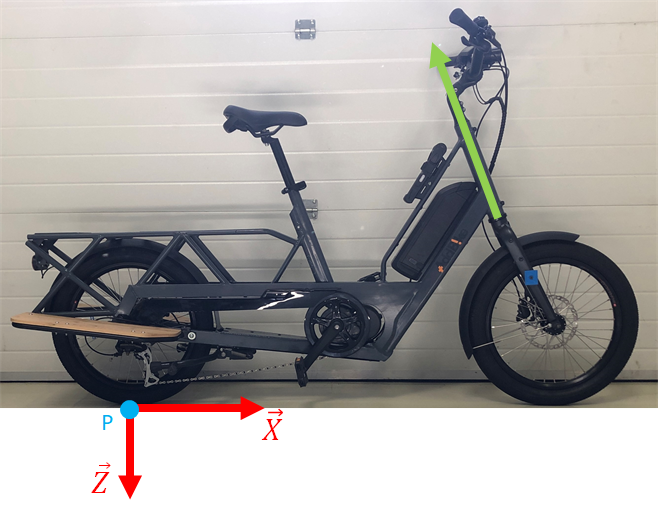

$origin$ parameter is used to modifiy the QR code position in the displayed image. 

When $origin$ = \[0,0\], the top left corner of the QR code is placed in the upper left corner of the image (example below). 

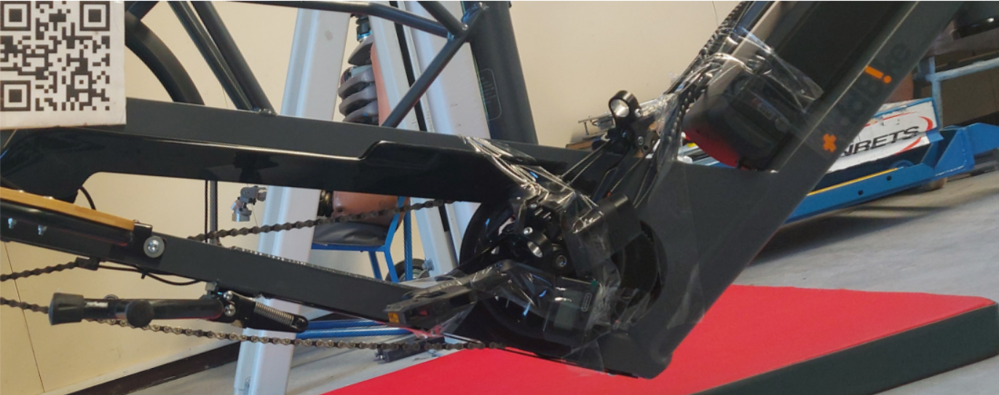

But if you modify its value, you can display the all part that you are measuring. 

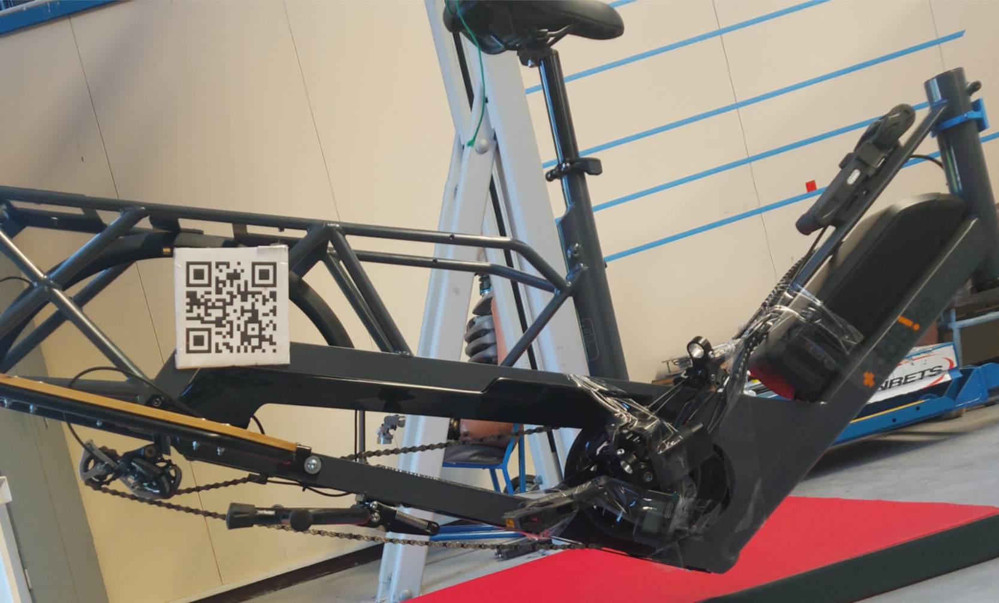

# <font color='red'>These variables are the ones you need to modify according to your part</font>

In [2]:
print("You have to modify this cell to enter the specific values of the part")

# first, we define the point of which we know the coordinates
R_wheel = 259 # mm
wheelbase = 1348 # mm /!\ 0 if you are measuring the frame, wheelbase if you are measuring the handlebar

# then we define the axe which we know the orientation, we will select two points on this axe
real_angle = 90+29.5 # °

# Then we modify the image to display all the part we are measuring
origin = [250,600]

You have to modify this cell to enter the specific values of the part


On this code, we will need the coordinates of the center of gravity of the part we are measuring, given in the world reference frame. The values we obtained were measured after doing the multiple time the center of gravity measurement (in order to minimize the human influence on the measures). **This step is very important to optimize the accuracy of the results.**

In [13]:
# Position of the center of gravity (mean value from multiple measures from the first Tutorial)
xg = 1126 # mm
yg = 748 # mm
# On this example, the given coordinates are the ones of the steering part of the Addbike bicycle

Here we chose the file number we want to use for the display and the pointing of our interesting points. The best is to take the same image as the one for the center of gravity, so the last one of the $L$ list from the center of gravity code. 

In [4]:
L = 13 # number of the photo chose for the display

To modify the size of the display, we can modify this parameter.

In [5]:
scale_percent = 20 # percent of original size

## QR Code recognition

Now, we will open the image chosen and identify the position of the QR code on this image, for calibration, and making the coordinates transformation. This will be done automatically, without any display nor action from you. 

In [6]:
file = "addbike/img" + str(L) + ".JPG"
img = cv2.imread(file)

#======== Image resizing for display
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)
img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
img_temp = img.copy()
"""
qrCodeDetector = cv2.QRCodeDetector()
decodedText, points, _ = qrCodeDetector.detectAndDecode(img)
"""

decodedObject = pyzbar.decode(img)
points_1 = decodedObject[0].polygon

points = np.zeros((4,2)) 
points[0,0] = points_1[0][0]
points[0,1] = points_1[0][1]
points[3,0] = points_1[1][0]
points[3,1] = points_1[1][1]
points[2,0] = points_1[2][0]
points[2,1] = points_1[2][1] 
points[1,0] = points_1[3][0]
points[1,1] = points_1[3][1]
points = [points]

if points is not None:
    nrOfPoints = len(points[0])

    for i in range(nrOfPoints):
        cv2.circle(img, (int(points[0][i][0]), int(points[0][i][1])), radius = 2, color = (255,0,0), thickness = 2)
    calib_pt_list = []
    
    # ======= Transformation matrix
    calib_pt0_real=[0,0]
    calib_pt1_real=[120,0] 
    calib_pt2_real=[120,120]
    calib_pt3_real=[0,120]

    #Coordinates of the square corners
    image_line_pts_1 = np.float32(points[0])
    #Coordinates of the square corners in reality (measured with a tape measure)
    image_line_pts_2 = np.float32([calib_pt0_real, calib_pt1_real, calib_pt2_real, calib_pt3_real])

    #Transformation for the calibration
    dim = (2000,2500)
    image_line_pts_3 = np.float32(np.add(image_line_pts_2,origin))
    M = cv2.getPerspectiveTransform(image_line_pts_1,image_line_pts_3)
    calibrated_img=cv2.warpPerspective(img, M, dim)
    calibrated_img_temp = cv2.warpPerspective(img_temp, M, dim)

## Pointing the points for the frame transformation

Then we will display the calibrated image, in order to point the wheel center. 

In [7]:
# ========== Wheel center
img_finale_new = calibrated_img_temp
pos_roue = [0,0]
def get_point_4(event, x, y, flags, param):
    global pos_roue
    if event == cv2.EVENT_LBUTTONUP:
        pos_roue = np.subtract([x,y],origin)
        cv2.circle(img_finale_new,(x,y),radius = 2,color=(255, 0, 0), thickness=1)
        cv2.imshow("Final image",img_finale_new)
        print("Coordinates of the wheel center in the QR code reference frame : ",pos_roue)
        print("Press any key")


print("Select the wheel center")
cv2.imshow('Final image',img_finale_new)
cv2.setMouseCallback('Final image',get_point_4)
c = cv2.waitKey(0)
cv2.destroyAllWindows()

Select the wheel center
Coordinates of the wheel center in the QR code reference frame :  [327 119]
Press any key


Then we will point a new point, then we have an axis between the two pointed points, the angle of this axis is $real\_angle$. 

In our example, we $real\_angle$ is the angle of the axis between wheel center and on of the screw in the side of the fork and horizontal.

In [8]:
pos_tube_diag = [0,0]
def get_point_5(event, x, y, flags, param):
    global pos_tube_diag
    if event == cv2.EVENT_LBUTTONUP:
        pos_tube_diag = np.subtract([x,y],origin)
        cv2.circle(img_finale_new,(x,y),radius = 2,color=(255, 0, 0), thickness=1)
        cv2.imshow("Final image",img_finale_new)
        print("Coordinates of the other axis point in the QR code reference frame : ",pos_tube_diag)
        print("Press any key")


print("Select the other point to form an axis")
cv2.imshow('Final image',img_finale_new)
cv2.setMouseCallback('Final image',get_point_5)
c = cv2.waitKey(0)
cv2.destroyAllWindows()

Select the other point to form an axis
Coordinates of the other axis point in the QR code reference frame :  [ 232 -169]
Press any key


This function will compute the reference frame transformation. It has to be the same as the one in the center of gravity code. 

In [9]:
def cgt_rep(vec) :
    global real_angle, empattement, R_roue
    x2 = pos_tube_diag[0]
    x1 = pos_roue[0]
    y2 = pos_tube_diag[1]
    y1 = pos_roue[1]
     
    angle = np.arctan2((y2-y1),(x2-x1))
  
    # print(angle*180/np.pi)
    real_angle_temp = - real_angle  * np.pi/180
    angle_rota =  real_angle_temp - angle
    # print("angle_rota : ",angle_rota*180/np.pi)
    R = np.zeros((2,2))
    R[0,0] = np.cos(angle_rota)
    R[0,1] = -np.sin(angle_rota)
    R[1,0] = np.sin(angle_rota)
    R[1,1] = np.cos(angle_rota)
    vec = np.subtract(vec,origin)
    vec = np.subtract(vec,[x1,y1])
    vec = R @ vec
    vec[1]=-vec[1] 
    vec = np.add(vec,[wheelbase,R_wheel])
    return vec

## Computing the distance between a line and the center of gravity of the part

To determine the inertie of the part, we have to know the distance between the oscillation axis and the center of gravity of the part. 

First, we have to select 2 points of the oscillation axis. To do so, we took a photo for each oscillating position. To help ourselves identifying the position of the axis. 

An example of a photo taken during one of the measurement for the frame of the Addbike bicycle is given below : 

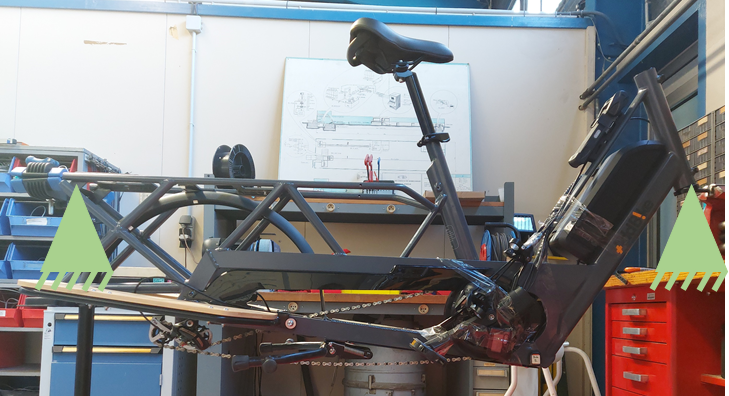

On which we redefined with green triangles the position of the points of contact of the frame. 

Then, we can use our calibrated image and point the points we defined precedently on this image. An example of the pointing is given below (red circles represent the pointed points for one configuration) : 

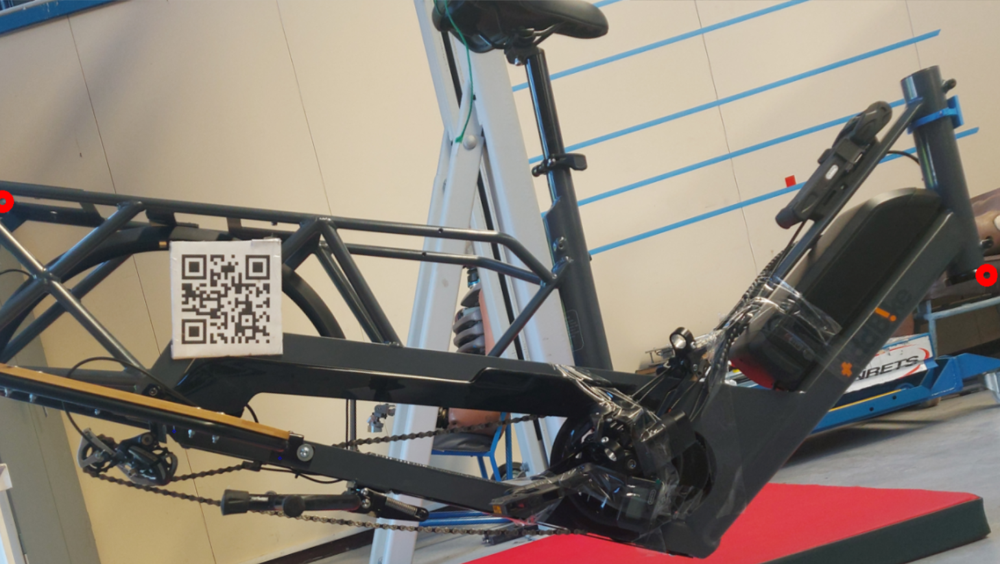

Here is the code used for the pointing of the oscillation axis (for example the steering axis):

In [10]:
calibrated_img=img_finale_new
clicked_pt_list = []
def get_point_8(event, x, y, flags, param):
    global clicked_pt_list,i
    if event == cv2.EVENT_LBUTTONUP:
        cv2.circle(calibrated_img,(x,y),radius = 10,color=(0, 0, 255), thickness=10)
        cv2.imshow("Image calibree",calibrated_img)
        print("Point ",i," : ",cgt_rep([x,y]))
        i+=1
        clicked_pt_list.append(cgt_rep([x,y]))

print("Select 2 points of the oscillation axis")
cv2.imshow('Image calibree',calibrated_img)
# cv2.moveWindow('Image calibree',40,30)
cv2.setMouseCallback('Image calibree',get_point_8)
c = cv2.waitKey(0)
cv2.destroyAllWindows()

Select 2 points of the oscillation axis
Point  3  :  [1080.55722174  824.7096078 ]
Point  4  :  [1154.29724475  653.8078553 ]


Now that we know the coordinates of the oscillation axis of the part, we can compute the shortest distance between it and the center of gravity of the part. The computed distance is represented below : 

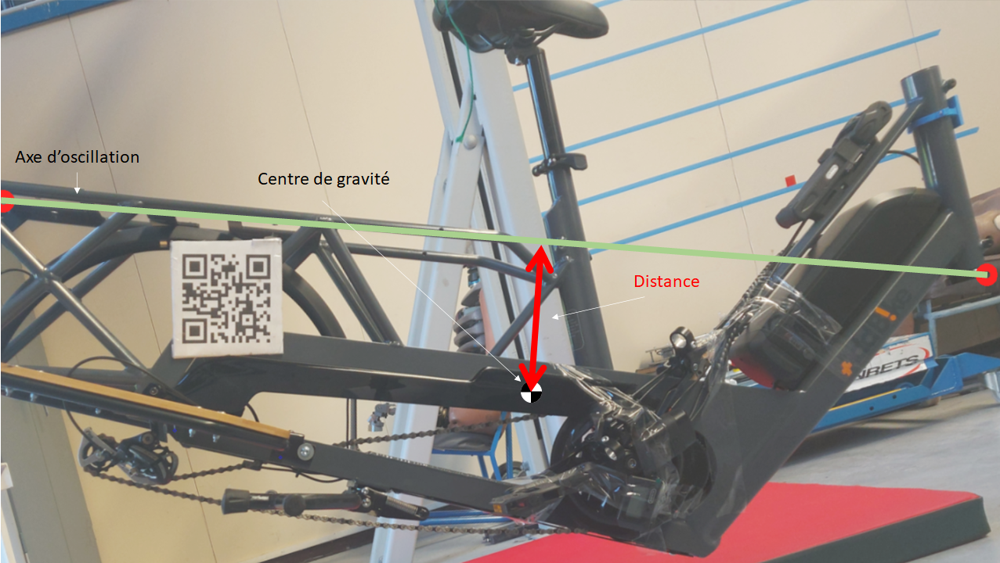

We display here the angle formed by this line on the world reference frame to verify that we did not do any mistake during the pointing. The angle has to be the same as the experimental one. 

On this example, we measured the distance between the center of gravity of the steering part and the steering axis, we found the right angle. 

In [11]:
# ====== Getting the distance between the oscillation axis and the center of gravity
a = (clicked_pt_list[1][1]-clicked_pt_list[0][1])/(clicked_pt_list[1][0]-clicked_pt_list[0][0])
print("The angle of this axis : ")
print((np.arctan2(clicked_pt_list[1][1]-clicked_pt_list[0][1],clicked_pt_list[1][0]-clicked_pt_list[0][0]))*180/np.pi)
b = (clicked_pt_list[0][0]*clicked_pt_list[1][1]-clicked_pt_list[0][1]*clicked_pt_list[1][0])/(clicked_pt_list[0][0]-clicked_pt_list[1][0])
from math import sqrt
def function_to_optimize(x):
    y = a*x + b
    return sqrt((x - xg)**2 + (y - yg)**2)
res = minimize_scalar(function_to_optimize)
print("The distance between the line and the center of gravity : ")
print(res.fun)

The angle of this axis : 
-66.66095631541369
The distance between the line and the center of gravity : 
11.334353555019064
